# Algorithmic Trading Model for Cramer COVID-19 Index Using Python
### David Lowe
### June 29, 2020

SUMMARY: The purpose of this project is to construct and test an algorithmic trading model and document the end-to-end steps using a template.

INTRODUCTION: CNBC’s Jim Cramer, the host of Mad Money show, presented a list of stocks on April 27 that he believes will work well in this coronavirus-plagued market. The ‘Cramer COVID-19 Index’ contains 100 companies that touch 17 sectors where investors can expect a positive return in this volatile market environment. The project aims to analyze these 100 stocks and develop strategies for trading these stocks, either individually or in groups.

In iteration Take1, we constructed the necessary code segments for downloading and visualizing the index and the stocks. The script leveraged various data sources, both free and paid subscriptions, for pulling the required dataset together.

In iteration Take2, we built on the previous analysis by constructing a dual moving average crossover trading model (20-day and 50-day) and applying the model to the stocks in the index. For each stock, we also identified the entry and exit dates starting around January 1, 2019.

In iteration Take3, we built on the previous analysis by constructing a module to calculate profit and loss for the dual moving average crossover trading model and applying the model to the stocks in the index.

In this Take4 iteration, we will build on the previous analysis by constructing a module to calculate profit and loss for the long-only investing approach. The long-only investing approach assumes we buy and hold the stock from the first day of the trading model to now.

NOTE: This script calculates the index value by using the number of outstanding shares from each company. Such an approach may not match how CNBC calculates this index (https://www.cnbc.com/cramer-covid-19-stocks/). This script is for educational purposes only and does not constitute a recommendation for buying or selling any stock mentioned in this script.

ANALYSIS: Refer to the trading model and long-only return ranking for each stock in the index under Task 5.

CONCLUSION: Refer to the trading model and long-only return ranking for each stock in the index under Task 5.

Dataset ML Model: Time series analysis with numerical attributes

Dataset Used: IEX Cloud and Quandl

An algorithmic trading modeling project generally can be broken down into about five major tasks:

1. Prepare Environment
2. Acquire and Pre-Process Data
3. Develop Strategy and Train Model
4. Back-test Model
5. Evaluate Performance

## Task 1. Prepare Environment

In [1]:
!pip install python-dotenv PyMySQL

In [2]:
# Retrieve CPU information from the system
ncpu = !nproc
print("The number of available CPUs is:", ncpu[0])

The number of available CPUs is: 2


In [3]:
import os
import sys
import smtplib
import numpy as np
import pandas as pd
import requests
import json
from email.message import EmailMessage
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from time import sleep
from dotenv import load_dotenv

In [4]:
# Begin the timer for the script processing
startTimeScript = datetime.now()

# Set up the verbose flag to print detailed messages for debugging (setting True will activate!)
verbose = False

# Set up the sendNotification flag to send progress emails (setting True will send emails!)
notifyStatus = False

# Set up the parent directory location for loading the dotenv files
useColab = True
if useColab:
    # Mount Google Drive locally for storing files
    from google.colab import drive
    drive.mount('/content/gdrive')
    gdrivePrefix = '/content/gdrive/My Drive/Colab_Downloads/'
    env_path = '/content/gdrive/My Drive/Colab Notebooks/'
    dotenv_path = env_path + "python_script.env"
    load_dotenv(dotenv_path=dotenv_path)

# Set up the dotenv file for retrieving environment variables
LocalPC = False
if LocalPC:
    env_path = "/Users/david/PycharmProjects/"
    dotenv_path = env_path + "python_script.env"
    load_dotenv(dotenv_path=dotenv_path)

# Configure the plotting style
plt.style.use('seaborn')

# Set Pandas options
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 140)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [5]:
if notifyStatus: email_notify("Task 1. Prepare Environment has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [6]:
# Check and see whether the API key is available
alphavantage_key = os.environ.get('ALPHAVANTAGE_API')
if alphavantage_key is None: sys.exit("API key for Alpha Vantage not available. Script Processing Aborted!!!")

# Check and see whether the API key is available
iexcloud_key = os.environ.get('IEXCLOUD_API')
if iexcloud_key is None: sys.exit("API key for IEX Cloud not available. Script Processing Aborted!!!")

# Check and see whether the API key is available
quandl_key = os.environ.get('QUANDL_API')
if quandl_key is None: sys.exit("API key for Quandl not available. Script Processing Aborted!!!")

In [7]:
# Specify the parameters for the trading strategy
fast_ma = 20
slow_ma = 50

model_start_date = datetime(2019, 1, 1)
print("Starting date for the model:", model_start_date)
stock_start_date = model_start_date - timedelta(days=int(slow_ma*1.5)) # Need more pricing data to calculate moving averages

# model_end_date = datetime(2020, 1, 1)
model_end_date = datetime.now()
print("Ending date for the model:", model_end_date)

stock_data_dates = pd.date_range(start=stock_start_date, end=model_end_date)

Starting date for the model: 2019-01-01 00:00:00
Ending date for the model: 2020-06-29 23:44:59.897696


In [8]:
if notifyStatus: email_notify("Task 1. Prepare Environment completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 2. Acquire and Pre-Process Data

In [9]:
if notifyStatus: email_notify("Task 2. Acquire and Pre-Process Data has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [10]:
dataset_path = 'https://www.dainesanalytics.com/datasets/cramer-covid19-index/Cramer_COVID-19_Index.csv'
stock_meta = pd.read_csv(dataset_path, sep=',')
stock_meta.set_index('Symbol', inplace=True)
stock_meta = stock_meta.sort_index(ascending = True)
stock_meta.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 100 entries, AAPL to ZTS
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Name    100 non-null    object
dtypes: object(1)
memory usage: 1.6+ KB


In [11]:
# Take a peek at the dataframe after import
stock_meta.head()

,Name
Symbol,
AAPL,Apple
ABBV,AbbVie
ABT,Abbott Labs
ADBE,Adobe
AKAM,Akamai Technologies


In [12]:
stock_list = stock_meta.index.tolist()
if verbose: print('Stocks to process:', stock_list)

In [13]:
for ticker in stock_list:
    iexcloud_url = "https://cloud.iexapis.com/stable/stock/%s/stats/sharesOutstanding?token=%s" % (ticker, iexcloud_key)
    sleep(1)
    response = requests.get(iexcloud_url)
    share_data = json.loads(response.text)
    stock_meta.loc[ticker,'Share_Outstanding'] = share_data
    print('Company outstanding share number retrieved for', ticker, ':', share_data)

Company outstanding share number retrieved for AAPL : 4334340000
Company outstanding share number retrieved for ABBV : 1762340000
Company outstanding share number retrieved for ABT : 1768850000
Company outstanding share number retrieved for ADBE : 481801000
Company outstanding share number retrieved for AKAM : 162274000
Company outstanding share number retrieved for AMD : 1171190000
Company outstanding share number retrieved for AMT : 443306000
Company outstanding share number retrieved for AMZN : 498776000
Company outstanding share number retrieved for ATVI : 770486000
Company outstanding share number retrieved for BAX : 508836000
Company outstanding share number retrieved for BNTX : 228604644
Company outstanding share number retrieved for BSX : 1399350000
Company outstanding share number retrieved for BYND : 62236700
Company outstanding share number retrieved for CAG : 487076000
Company outstanding share number retrieved for CCI : 416751000
Company outstanding share number retrieved 

In [14]:
stock_meta.head()

,Name,Share_Outstanding
Symbol,,
AAPL,Apple,4.334340e+09
ABBV,AbbVie,1.762340e+09
ABT,Abbott Labs,1.768850e+09
ADBE,Adobe,4.818010e+08
AKAM,Akamai Technologies,1.622740e+08


In [15]:
stock_meta.tail()

,Name,Share_Outstanding
Symbol,,
WMT,Walmart,2.831950e+09
WORK,Slack,4.325990e+08
ZM,Zoom Video,1.821060e+08
ZS,Zscaler,1.305180e+08
ZTS,Zoetis,4.749410e+08


In [16]:
total_shares = stock_meta['Share_Outstanding'].sum()
print('Total number of outstanding shares used to calculate the index:', total_shares)

Total number of outstanding shares used to calculate the index: 73020241767.0


In [17]:
# Create the dataframe to hold the index and individual stock components
columns = ['JC_MAD']
index_df = pd.DataFrame(index=stock_data_dates, columns=columns)
index_df = index_df.fillna(0.0)
index_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 621 entries, 2018-10-18 to 2020-06-29
Freq: D
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   JC_MAD  621 non-null    float64
dtypes: float64(1)
memory usage: 9.7 KB


In [18]:
index_df.head()

,JC_MAD
2018-10-18,0.0
2018-10-19,0.0
2018-10-20,0.0
2018-10-21,0.0
2018-10-22,0.0


In [19]:
# Create the dataframe to hold the stock opening prices
stock_open_df = pd.DataFrame(index=stock_data_dates)
stock_open_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 621 entries, 2018-10-18 to 2020-06-29
Freq: D
Empty DataFrame

In [20]:
# Create the dataframe to hold the stock closing prices
stock_close_df = pd.DataFrame(index=stock_data_dates)
stock_close_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 621 entries, 2018-10-18 to 2020-06-29
Freq: D
Empty DataFrame

In [21]:
start_date_string = stock_start_date.strftime('%Y-%m-%d')
end_date_string = model_end_date.strftime('%Y-%m-%d')

for ticker in stock_list:
    quandl_url = "https://www.quandl.com/api/v3/datatables/SHARADAR/SEP.json?date.gte=%s&date.lte=%s&ticker=%s&api_key=%s" % (start_date_string, end_date_string, ticker, quandl_key)
    response = requests.get(quandl_url)
    sleep(1)
    quandl_dict = json.loads(response.text)
    stock_data = pd.DataFrame(quandl_dict['datatable']['data'])
    print(len(stock_data), 'data points retrieved from the API call for:', ticker)
    stock_data.columns = ['ticker', 'date', 'open', 'high', 'low', 'close', 'volume', 'dividend', 'closeunadj', 'lastupdated']
    stock_data.index = pd.to_datetime(stock_data.date)
    stock_data = stock_data.sort_index(ascending = True)
    stock_open = stock_data.loc[:, ['open']]
    stock_open.rename(columns={'open': ticker}, inplace=True)
    stock_open_df = pd.concat([stock_open_df, stock_open], axis=1)
    stock_close = stock_data.loc[:, ['closeunadj']]
    stock_close.rename(columns={'closeunadj': ticker}, inplace=True)
    stock_close_df = pd.concat([stock_close_df, stock_close], axis=1)
    component_close = stock_data.loc[:, ['closeunadj']] * stock_meta.loc[ticker, 'Share_Outstanding'] / total_shares
    component_close.rename(columns={'closeunadj': ticker}, inplace=True)
    index_df = pd.concat([index_df, component_close], axis=1)

426 data points retrieved from the API call for: AAPL
426 data points retrieved from the API call for: ABBV
426 data points retrieved from the API call for: ABT
426 data points retrieved from the API call for: ADBE
426 data points retrieved from the API call for: AKAM
426 data points retrieved from the API call for: AMD
426 data points retrieved from the API call for: AMT
426 data points retrieved from the API call for: AMZN
426 data points retrieved from the API call for: ATVI
426 data points retrieved from the API call for: BAX
181 data points retrieved from the API call for: BNTX
426 data points retrieved from the API call for: BSX
293 data points retrieved from the API call for: BYND
426 data points retrieved from the API call for: CAG
426 data points retrieved from the API call for: CCI
426 data points retrieved from the API call for: CHGG
263 data points retrieved from the API call for: CHWY
426 data points retrieved from the API call for: CL
426 data points retrieved from the AP

In [22]:
stock_open_df.dropna(inplace=True)
stock_open_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 181 entries, 2019-10-10 to 2020-06-29
Data columns (total 100 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    181 non-null    float64
 1   ABBV    181 non-null    float64
 2   ABT     181 non-null    float64
 3   ADBE    181 non-null    float64
 4   AKAM    181 non-null    float64
 5   AMD     181 non-null    float64
 6   AMT     181 non-null    float64
 7   AMZN    181 non-null    float64
 8   ATVI    181 non-null    float64
 9   BAX     181 non-null    float64
 10  BNTX    181 non-null    float64
 11  BSX     181 non-null    float64
 12  BYND    181 non-null    float64
 13  CAG     181 non-null    float64
 14  CCI     181 non-null    float64
 15  CHGG    181 non-null    float64
 16  CHWY    181 non-null    float64
 17  CL      181 non-null    float64
 18  CLX     181 non-null    float64
 19  CMG     181 non-null    float64
 20  CNC     181 non-null    float64
 21  COR     181 non-nul

In [23]:
stock_close_df.dropna(inplace=True)
stock_close_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 181 entries, 2019-10-10 to 2020-06-29
Data columns (total 100 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    181 non-null    float64
 1   ABBV    181 non-null    float64
 2   ABT     181 non-null    float64
 3   ADBE    181 non-null    float64
 4   AKAM    181 non-null    float64
 5   AMD     181 non-null    float64
 6   AMT     181 non-null    float64
 7   AMZN    181 non-null    float64
 8   ATVI    181 non-null    float64
 9   BAX     181 non-null    float64
 10  BNTX    181 non-null    float64
 11  BSX     181 non-null    float64
 12  BYND    181 non-null    float64
 13  CAG     181 non-null    float64
 14  CCI     181 non-null    float64
 15  CHGG    181 non-null    float64
 16  CHWY    181 non-null    float64
 17  CL      181 non-null    float64
 18  CLX     181 non-null    float64
 19  CMG     181 non-null    float64
 20  CNC     181 non-null    float64
 21  COR     181 non-nul

In [24]:
index_df.dropna(inplace=True)
index_df['JC_MAD'] = index_df[stock_list].sum(axis=1)
index_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 181 entries, 2019-10-10 to 2020-06-29
Data columns (total 101 columns):
 #   Column  Dtype  
---  ------  -----  
 0   JC_MAD  float64
 1   AAPL    float64
 2   ABBV    float64
 3   ABT     float64
 4   ADBE    float64
 5   AKAM    float64
 6   AMD     float64
 7   AMT     float64
 8   AMZN    float64
 9   ATVI    float64
 10  BAX     float64
 11  BNTX    float64
 12  BSX     float64
 13  BYND    float64
 14  CAG     float64
 15  CCI     float64
 16  CHGG    float64
 17  CHWY    float64
 18  CL      float64
 19  CLX     float64
 20  CMG     float64
 21  CNC     float64
 22  COR     float64
 23  COST    float64
 24  COUP    float64
 25  CPB     float64
 26  CRM     float64
 27  CRWD    float64
 28  CTXS    float64
 29  D       float64
 30  DDOG    float64
 31  DG      float64
 32  DHR     float64
 33  DOCU    float64
 34  DPZ     float64
 35  DXCM    float64
 36  EA      float64
 37  EBAY    float64
 38  EBS     float64
 39  EQIX    f

In [25]:
index_df.head()

,JC_MAD,AAPL,ABBV,ABT,ADBE,AKAM,AMD,AMT,AMZN,ATVI,BAX,BNTX,BSX,BYND,CAG,CCI,CHGG,CHWY,CL,CLX,CMG,CNC,COR,COST,COUP,CPB,CRM,CRWD,CTXS,D,DDOG,DG,DHR,DOCU,DPZ,DXCM,EA,EBAY,EBS,EQIX,ETSY,EVBG,GILD,GIS,GOLD,GOOG,GSK,HD,HRL,JNJ,K,KR,LLY,LOGI,LVGO,MASI,MDLZ,MKC,MKTX,MRNA,MRVL,MSFT,NET,NFLX,NVDA,OKTA,PANW,PEP,PFE,PG,PLD,PRGO,PTON,PYPL,REGN,RMD,RNG,SHOP,SJM,SNY,SPGI,SPLK,SPOT,SQ,TDOC,TGT,TMO,TTD,TTWO,TW,TWLO,UNH,VEEV,VZ,WING,WIX,WMT,WORK,ZM,ZS,ZTS
2019-10-10,119.010633,13.657696,1.796847,1.941320,1.814369,0.198586,0.455194,1.373746,11.750501,0.566520,0.610504,0.044581,0.727844,0.115916,0.189107,0.788868,0.053322,0.029286,0.830133,0.258268,0.316166,0.349681,0.060945,1.796686,0.141128,0.195814,1.803375,0.127170,0.163925,0.939930,0.085830,0.553359,1.325477,0.168731,0.136484,0.195243,0.365822,0.365003,0.037694,0.693616,0.093892,0.031704,1.086705,0.453316,0.436108,5.564333,1.439767,3.411399,0.307560,4.656520,0.292690,0.254005,1.401344,0.092454,0.025265,0.107148,1.083200,0.280553,0.186430,0.075400,0.212199,14.446083,0.036900,1.689343,1.541538,0.182218,0.276503,2.620128,2.722634,4.134190,0.867947,0.097063,0.065302,1.616676,0.452209,0.258488,0.183972,0.468156,0.167136,1.540608,0.827971,0.257057,0.284176,0.308355,0.069345,0.757142,1.518030,0.103957,0.190997,0.047192,0.194436,2.905784,0.277832,3.390519,0.035733,0.088029,4.638844,0.141119,0.177093,0.084545,0.828705
2019-10-11,119.884493,14.020968,1.777056,1.928965,1.836209,0.199008,0.477168,1.362636,11.830146,0.578443,0.613430,0.043266,0.732635,0.111986,0.189507,0.780079,0.054406,0.030036,0.827083,0.257412,0.317159,0.351109,0.061527,1.799467,0.144490,0.193952,1.839835,0.124809,0.166055,0.941310,0.085999,0.559323,1.325095,0.167198,0.138101,0.196368,0.372385,0.370969,0.037752,0.686840,0.096314,0.033229,1.099245,0.451158,0.413949,5.595546,1.437382,3.456323,0.303796,4.738422,0.291564,0.258374,1.420218,0.093802,0.023630,0.107764,1.071667,0.278979,0.180771,0.074841,0.219033,14.506319,0.037216,1.704099,1.566468,0.184874,0.277983,2.615378,2.746977,4.105372,0.868251,0.099751,0.063186,1.633399,0.455862,0.256883,0.182907,0.475067,0.167136,1.544387,0.834636,0.262844,0.291677,0.305919,0.068774,0.765770,1.534149,0.111114,0.191028,0.046295,0.201576,2.884224,0.281067,3.396186,0.035915,0.088819,4.663278,0.153974,0.177941,0.086011,0.835599
2019-10-14,119.728089,14.000786,1.780194,1.933568,1.832844,0.199653,0.489678,1.369861,11.860952,0.580448,0.607647,0.039916,0.727652,0.107657,0.185304,0.776940,0.055236,0.029736,0.814180,0.254791,0.316311,0.348174,0.061277,1.798984,0.145363,0.193787,1.839835,0.112902,0.166173,0.933724,0.079778,0.555738,1.325859,0.168606,0.135107,0.202473,0.371159,0.369141,0.037673,0.687919,0.096070,0.033535,1.108178,0.448336,0.416384,5.603326,1.437041,3.449253,0.302394,4.716413,0.292784,0.256775,1.414189,0.093322,0.024715,0.107415,1.059937,0.276016,0.181415,0.074176,0.219124,14.492818,0.035454,1.719759,1.571016,0.184126,0.282118,2.611767,2.761431,4.070112,0.872499,0.099023,0.060589,1.636132,0.462940,0.256011,0.186092,0.496767,0.166949,1.542325,0.829291,0.260386,0.290869,0.307361,0.069906,0.761113,1.537448,0.112715,0.189062,0.045881,0.205542,2.865002,0.283267,3.377485,0.035854,0.088678,4.621780,0.145858,0.176569,0.084903,0.823371
2019-10-15,120.931896,13.968139,1.798054,1.985892,1.843467,0.202964,0.492726,1.361179,12.072361,0.586251,0.611410,0.040449,0.737042,0.104026,0.180635,0.768493,0.055964,0.030901,0.802333,0.253917,0.315780,0.358564,0.060867,1.804244,0.142093,0.192876,1.881344,0.114331,0.168134,0.935333,0.083901,0.558702,1.314300,0.168354,0.136998,0.193359,0.376180,0.374145,0.038937,0.692949,0.097549,0.033859,1.121749,0.445015,0.405670,5.722423,1.440449,3.470463,0.302689,4.792903,0.290626,0.259013,1.437780,0.093208,0.026068,0.108334,1.056419,0.272612,0.181358,0.076306,0.222313,14.703122,0.036968,1.712050,1.653891,0.184269,0.280836,2.590485,2.776645,3.973487,0.901326,0.100442,0.066163,1.665719,0.460484,0.258448,0.186345,0.499336,0.167621,1.565345,0.836153,0.260756,0.299506,0.319589,0.071170,0

In [26]:
index_df.tail()

,JC_MAD,AAPL,ABBV,ABT,ADBE,AKAM,AMD,AMT,AMZN,ATVI,BAX,BNTX,BSX,BYND,CAG,CCI,CHGG,CHWY,CL,CLX,CMG,CNC,COR,COST,COUP,CPB,CRM,CRWD,CTXS,D,DDOG,DG,DHR,DOCU,DPZ,DXCM,EA,EBAY,EBS,EQIX,ETSY,EVBG,GILD,GIS,GOLD,GOOG,GSK,HD,HRL,JNJ,K,KR,LLY,LOGI,LVGO,MASI,MDLZ,MKC,MKTX,MRNA,MRVL,MSFT,NET,NFLX,NVDA,OKTA,PANW,PEP,PFE,PG,PLD,PRGO,PTON,PYPL,REGN,RMD,RNG,SHOP,SJM,SNY,SPGI,SPLK,SPOT,SQ,TDOC,TGT,TMO,TTD,TTWO,TW,TWLO,UNH,VEEV,VZ,WING,WIX,WMT,WORK,ZM,ZS,ZTS
2020-06-23,159.933748,21.756510,2.348572,2.211661,2.906830,0.224187,0.865959,1.605780,18.882728,0.806676,0.581794,0.165145,0.694690,0.130226,0.228262,0.944735,0.112978,0.056415,0.855352,0.365568,0.396916,0.505765,0.062336,1.821779,0.241096,0.203180,2.328708,0.215926,0.241288,0.951654,0.216238,0.654882,1.677288,0.419189,0.202258,0.514335,0.516333,0.479229,0.053383,0.842097,0.164510,0.066109,1.289238,0.506359,0.625307,6.741679,1.417276,3.686833,0.351329,5.154427,0.311227,0.342012,2.088386,0.143401,0.102733,0.169134,1.014975,0.291932,0.269721,0.335148,0.313060,20.969150,0.079992,2.808304,3.183638,0.311124,0.302938,2.496048,2.492895,3.991456,0.924995,0.102794,0.154874,2.778450,0.952979,0.360480,0.293680,1.314911,0.166231,1.802758,1.083947,0.420081,0.610579,0.520719,0.201967,0.831986,1.929964,0.229602,0.223719,0.071794,0.379475,3.865201,0.442009,3.113407,0.054073,0.171696,4.695468,0.201666,0.630486,0.197171,0.898300
2020-06-24,157.109549,21.372464,2.296199,2.114764,2.848304,0.224387,0.840296,1.543127,18.677740,0.797496,0.574686,0.171343,0.648697,0.129024,0.225394,0.925159,0.108626,0.057372,0.844912,0.363255,0.400273,0.490775,0.061900,1.802007,0.236907,0.202187,2.285474,0.214746,0.240358,0.949125,0.213369,0.661363,1.637837,0.411926,0.201150,0.498408,0.517401,0.469317,0.052521,0.835963,0.159553,0.063206,1.304355,0.500466,0.626037,6.592335,1.385925,3.625265,0.352510,5.044743,0.304469,0.349683,2.058110,0.142326,0.098996,0.164576,0.989953,0.291695,0.262281,0.345265,0.306409,20.546464,0.079088,2.757650,3.111374,0.311442,0.295130,2.461845,2.448773,3.947043,0.908305,0.100703,0.156765,2.701427,0.917028,0.360302,0.282185,1.294221,0.165918,1.754314,1.049010,0.414707,0.613357,0.501481,0.200876,0.819797,1.882042,0.221953,0.218257,0.069954,0.374045,3.755843,0.433154,3.056171,0.054029,0.170257,4.665605,0.189402,0.638192,0.193506,0.873519
2020-06-25,158.958056,21.656195,2.340849,2.170964,2.883077,0.228654,0.832918,1.544220,18.815583,0.804143,0.594616,0.186934,0.649463,0.123885,0.224727,0.940112,0.109981,0.057026,0.852068,0.368206,0.400636,0.502513,0.062388,1.817184,0.251898,0.205249,2.319840,0.218908,0.238194,0.932575,0.216021,0.657295,1.644428,0.423210,0.200196,0.503199,0.516887,0.475380,0.054639,0.844703,0.164608,0.064735,1.296796,0.500798,0.626524,6.635426,1.401260,3.614218,0.359226,5.039331,0.307426,0.349257,2.134521,0.143720,0.095847,0.163450,0.993667,0.302312,0.263408,0.330143,0.308595,20.806099,0.081347,2.806196,3.197113,0.324802,0.299754,2.496998,2.458662,3.996881,0.925197,0.102159,0.163848,2.773787,0.939641,0.369098,0.294735,1.322097,0.165137,1.781800,1.081506,0.419994,0.675511,0.520868,0.205658,0.820414,1.902595,0.229423,0.219084,0.071472,0.381714,3.847277,0.437794,3.076005,0.056196,0.179021,4.642723,0.194438,0.647195,0.199494,0.880088
2020-06-26,155.621833,20.990791,2.320093,2.148920,2.816897,0.234165,0.803566,1.496380,18.394063,0.806148,0.587508,0.194511,0.637773,0.120757,0.217723,0.920764,0.110776,0.054143,0.838930,0.368857,0.394620,0.473882,0.061584,1.793179,0.253249,0.200283,2.256159,0.204578,0.241373,0.915794,0.203725,0.652882,1.640225,0.446281,0.195969,0.484201,0.517638,0.489718,0.054050,0.832218,0.166656,0.066307,1.280992,0.491501,0.629933,6.260548,1.381836,3.549852,0.355831,4.972222,0.299683,0.348192,2.134127,0.143446,0.100456,0.161190,0.979005,0.298434,0.254307,0.326309,0.302764,20.389645,0.080285,2.670617,3.084254,0.323641,0.297759,2.449874,2.437362,3.906698,0.908609,0.100685,0.164893,2.747577,0.926607,0.367771,0.305080,1.312978,0.160874,1.749160,1.060986,0.428175,0.669147,0.518482,0.197053,0

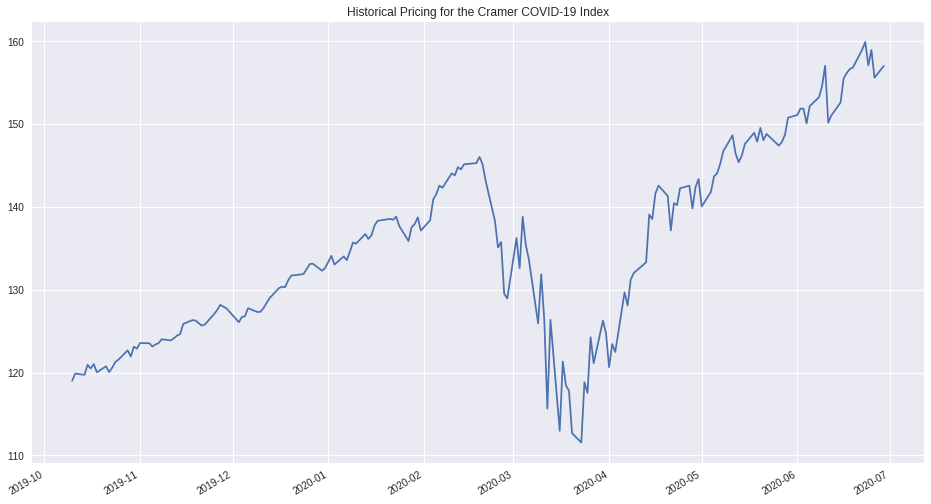

In [27]:
title_string = 'Historical Pricing for the Cramer COVID-19 Index'
index_df['JC_MAD'].plot(figsize=(16,9), title=title_string)
plt.show()

In [28]:
if notifyStatus: email_notify("Task 2. Acquire and Pre-Process Data completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 3. Develop Strategy and Train Model

In [29]:
if notifyStatus: email_notify("Task 3. Develop Strategy and Train Model has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [30]:
# Specify the parameters for the trading strategy
fast_ma = 10
slow_ma = 25

In [31]:
def ma_crossover(data):
    wait_for_entry = True
    for x in range(len(data)):
        if data['ma_change'].iloc[x] > 0:
            data['signal'].iloc[x] = 1  # Signal = 1 means we should take a long position
        else:
            data['signal'].iloc[x] = 0  # Signal = 0 means we should not have a position
        if x != 0:
            data['signal_chg'].iloc[x] = data['signal'].iloc[x] - data['signal'].iloc[x-1]
            if wait_for_entry and (data['signal_chg'].iloc[x-1] == 1):
                data['entry_exit'].iloc[x] = data['signal_chg'].iloc[x-1]
                wait_for_entry = False
            elif (not wait_for_entry) and (data['signal_chg'].iloc[x-1] != 0):
                data['entry_exit'].iloc[x] = data['signal_chg'].iloc[x-1]

In [32]:
model_collection = {}

for ticker in stock_list:
    print('Processing trading model for ticker symbol:', ticker)
    model_collection[ticker] = pd.DataFrame(stock_close_df[ticker])
    model_collection[ticker].rename(columns={ticker: 'close'}, inplace=True)
    model_collection[ticker]['open'] = stock_open_df[ticker]
    model_collection[ticker]['fast_ma'] = model_collection[ticker]['close'].rolling(fast_ma).mean()
    model_collection[ticker]['slow_ma'] = model_collection[ticker]['close'].rolling(slow_ma).mean()
    model_collection[ticker]['ma_change'] = model_collection[ticker]['fast_ma'] - model_collection[ticker]['slow_ma']
    model_collection[ticker]['signal'] = np.zeros(len(model_collection[ticker]))
    model_collection[ticker]['signal_chg'] = np.zeros(len(model_collection[ticker]))
    model_collection[ticker]['entry_exit'] = np.zeros(len(model_collection[ticker]))
    model_collection[ticker] = model_collection[ticker][model_start_date:model_end_date]
    if verbose:
        print(model_collection[ticker].head())
        print('...')
        print(model_collection[ticker].tail())
        print()
    ma_crossover(model_collection[ticker])

Processing trading model for ticker symbol: AAPL
Processing trading model for ticker symbol: ABBV
Processing trading model for ticker symbol: ABT
Processing trading model for ticker symbol: ADBE
Processing trading model for ticker symbol: AKAM
Processing trading model for ticker symbol: AMD
Processing trading model for ticker symbol: AMT
Processing trading model for ticker symbol: AMZN
Processing trading model for ticker symbol: ATVI
Processing trading model for ticker symbol: BAX
Processing trading model for ticker symbol: BNTX
Processing trading model for ticker symbol: BSX
Processing trading model for ticker symbol: BYND
Processing trading model for ticker symbol: CAG
Processing trading model for ticker symbol: CCI
Processing trading model for ticker symbol: CHGG
Processing trading model for ticker symbol: CHWY
Processing trading model for ticker symbol: CL
Processing trading model for ticker symbol: CLX
Processing trading model for ticker symbol: CMG
Processing trading model for ti

In [33]:
for ticker in stock_list:
    print('List the signal change and entry/exit points for', ticker)
    print(model_collection[ticker][(model_collection[ticker].signal_chg != 0) | (model_collection[ticker].entry_exit != 0)])
    print()

List the signal change and entry/exit points for AAPL
             close    open  fast_ma   slow_ma  ma_change  signal  signal_chg  entry_exit
2019-11-13  264.47  261.13  258.465  247.1044    11.3606     1.0         1.0         0.0
2019-11-14  262.64  263.75  259.853  248.4064    11.4466     1.0         0.0         1.0
2020-02-25  288.08  300.95  315.886  317.2312    -1.3452     0.0        -1.0         0.0
2020-02-26  292.65  286.53  313.190  316.2744    -3.0844     0.0         0.0        -1.0
2020-04-13  273.25  268.31  256.556  254.2964     2.2596     1.0         1.0         0.0
2020-04-14  287.05  280.00  259.780  255.1316     4.6484     1.0         0.0         1.0

List the signal change and entry/exit points for ABBV
            close   open  fast_ma  slow_ma  ma_change  signal  signal_chg  entry_exit
2019-11-13  86.66  85.74   83.419  79.1836     4.2354     1.0         1.0         0.0
2019-11-14  87.63  86.48   84.227  79.7108     4.5162     1.0         0.0         1.0
2019-12-13

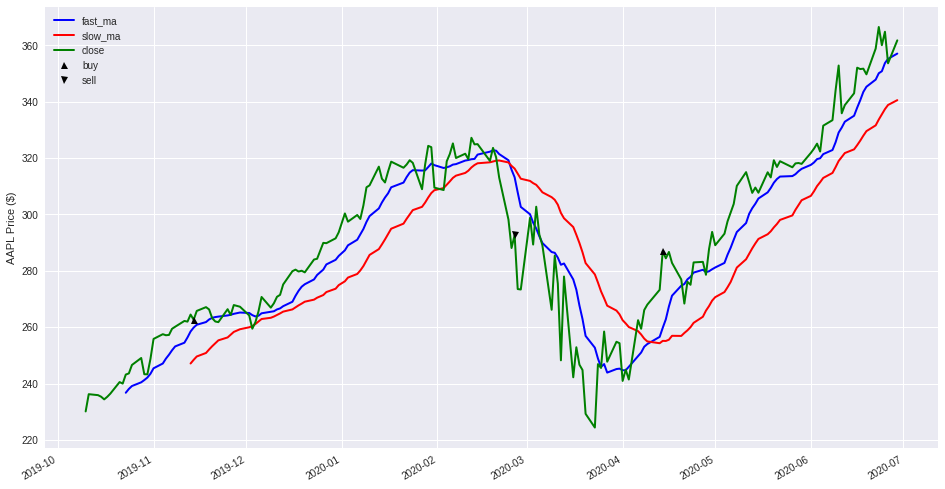

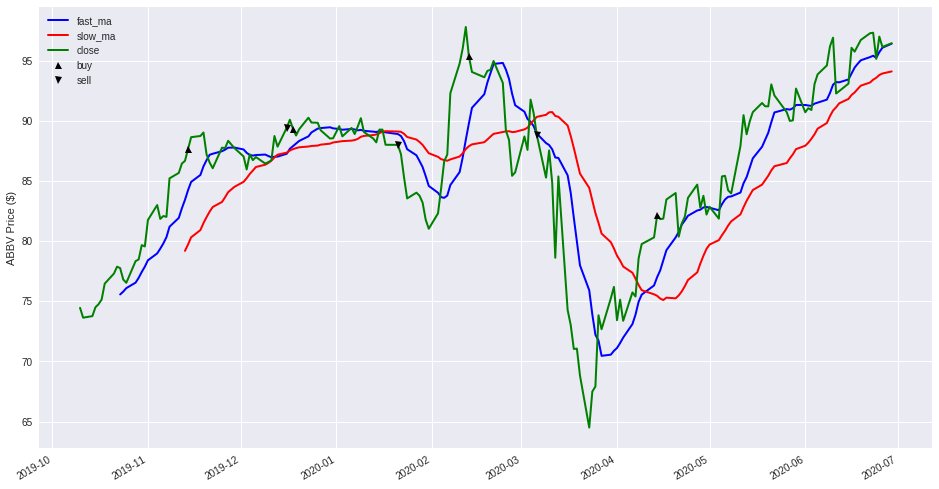

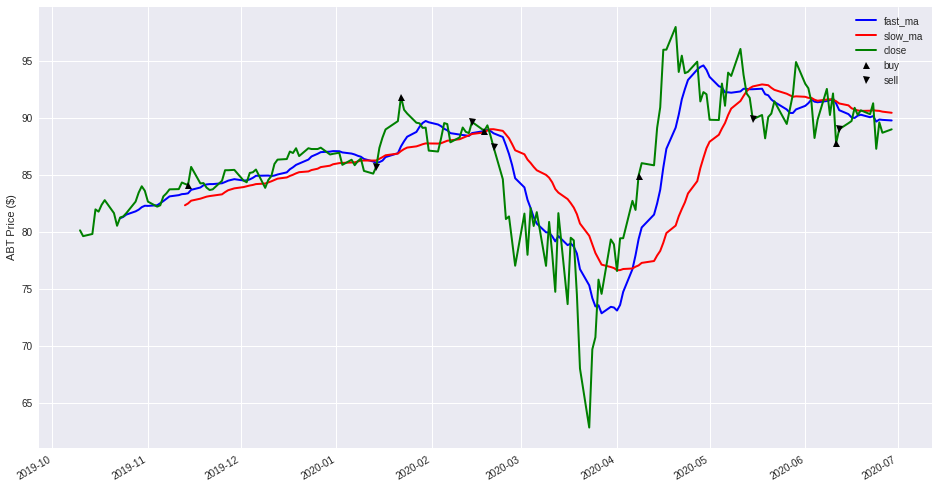

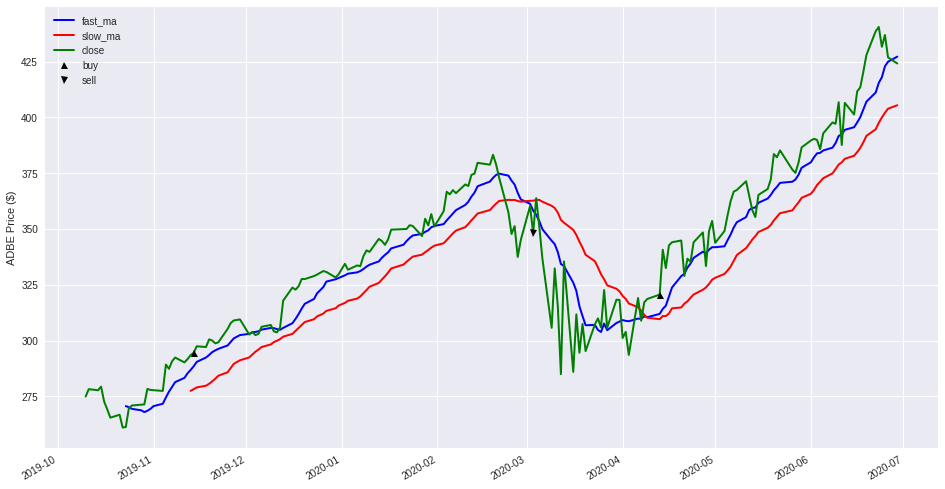

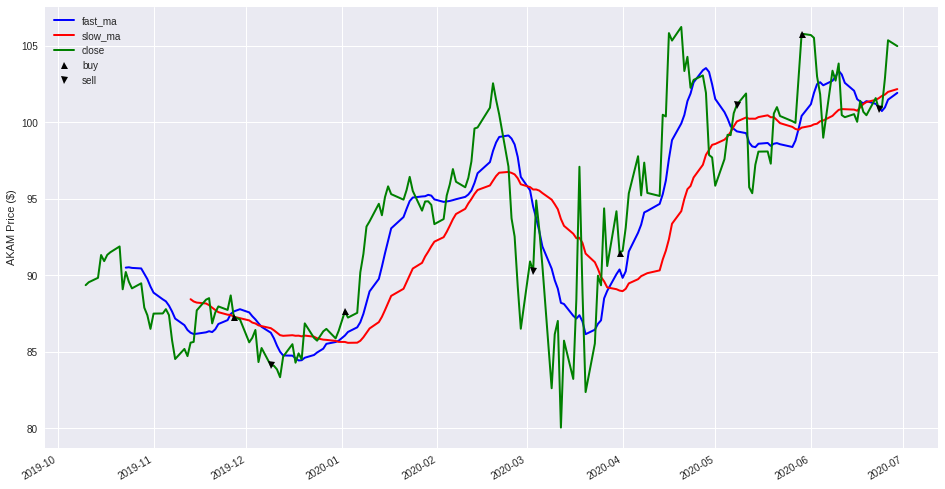

...

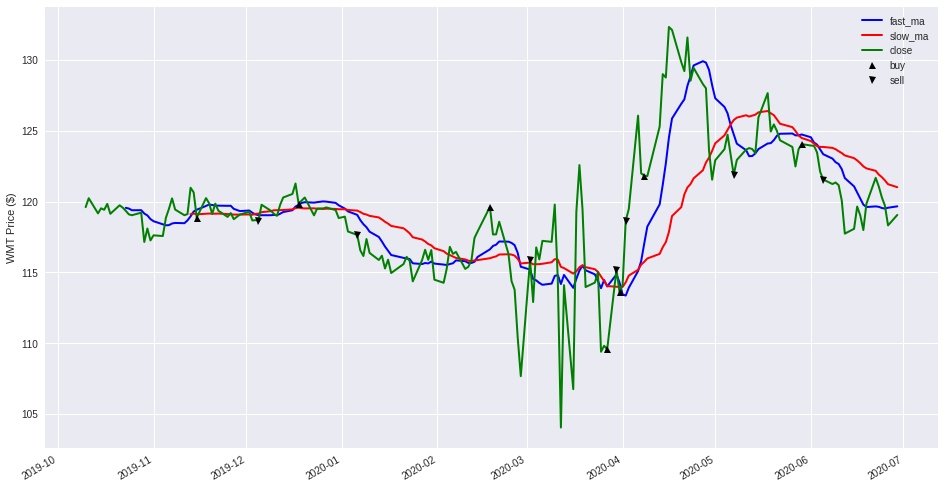

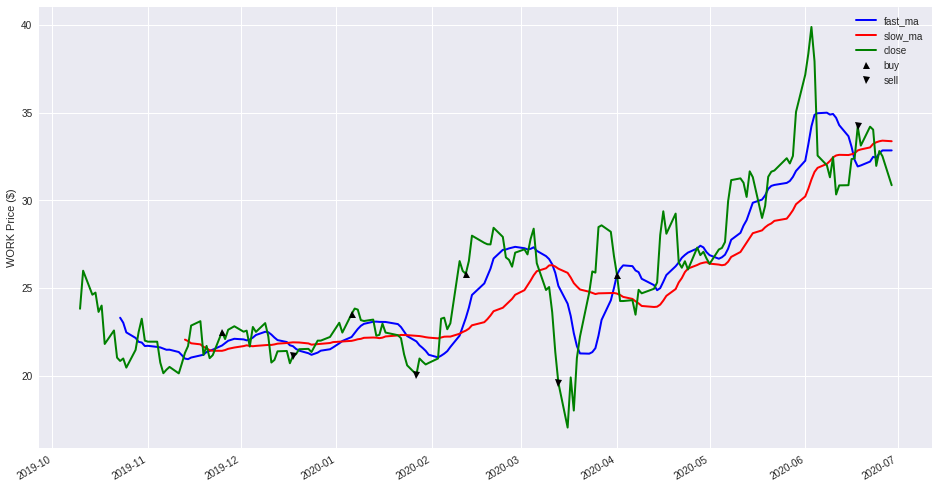

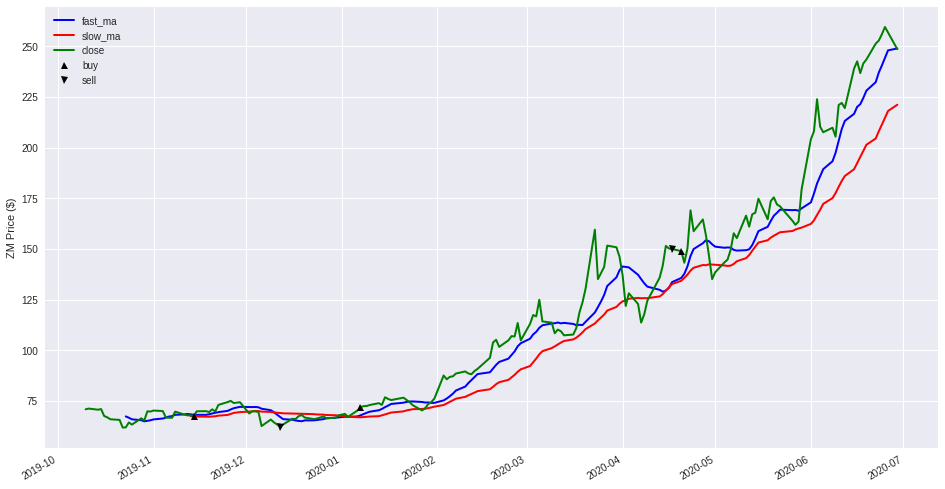

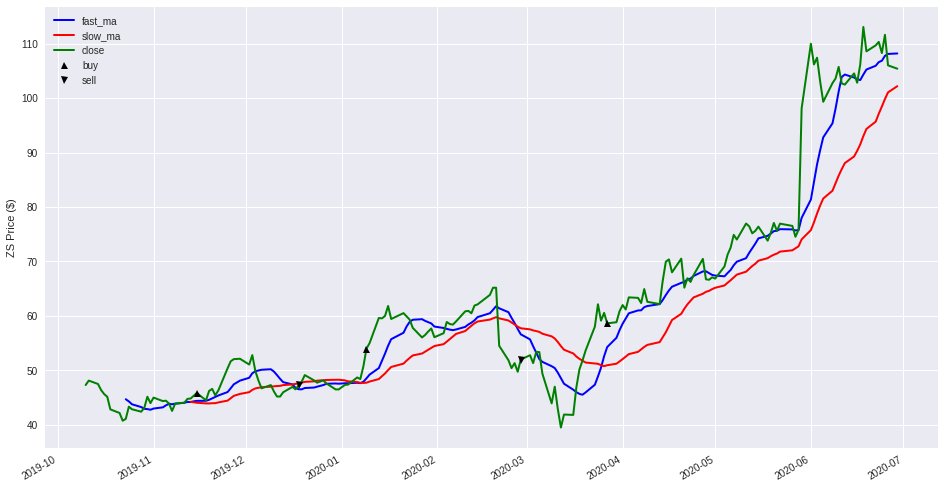

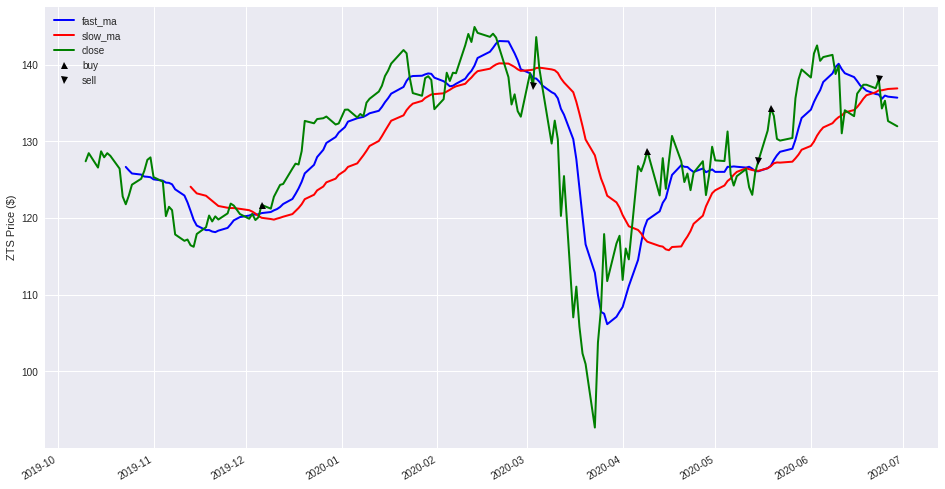

In [34]:
for ticker in stock_list:
    graph_data = model_collection[ticker][:]
    fig = plt.figure(figsize=(16,9))
    ylabel = ticker + ' Price ($)'
    ax1 = fig.add_subplot(111, ylabel=ylabel)
    graph_data['fast_ma'].plot(ax=ax1, color='b', lw=2.)
    graph_data['slow_ma'].plot(ax=ax1, color='r', lw=2.)
    graph_data['close'].plot(ax=ax1, color='g', lw=2.)
    ax1.plot(graph_data.loc[graph_data.entry_exit == 1].index, graph_data.close[graph_data.entry_exit == 1], '^', markersize=7, color='k',label='buy')
    ax1.plot(graph_data.loc[graph_data.entry_exit == -1].index, graph_data.close[graph_data.entry_exit == -1], 'v', markersize=7, color='k',label='sell')
    plt.legend()
    plt.show()

In [35]:
if notifyStatus: email_notify("Task 3. Develop Strategy and Train Model completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 4. Back-test Model

In [36]:
if notifyStatus: email_notify("Task 4. Back-test Model has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [37]:
def trading_portfolio_generation(ticker_symbol, initial_fund, trading_model):
    # Construct a portfolio to track the transactions and returns
    portfolio = pd.DataFrame(index=trading_model[ticker_symbol].index, columns=['trade_action', 'qty_onhand', 'cost_basis', 'sale_proceed', 'gain_loss', 'cash_value', 'position_value', 'total_value', 'accumu_return'])
    portfolio.iloc[0]['trade_action'] = 0
    portfolio.iloc[0]['qty_onhand'] = 0
    portfolio.iloc[0]['cost_basis'] = 0.00
    portfolio.iloc[0]['sale_proceed'] = 0.00
    portfolio.iloc[0]['gain_loss'] = 0.00
    portfolio.iloc[0]['cash_value'] = initial_fund
    portfolio.iloc[0]['position_value'] = 0.00
    portfolio.iloc[0]['total_value'] = initial_fund
    portfolio.iloc[0]['accumu_return'] = portfolio.iloc[0]['total_value'] - initial_fund

    # The conditional parameters below determine how the trading strategy will be carried out
    for i in range(1, len(portfolio)):
        if (trading_model[ticker_symbol].iloc[i]['entry_exit'] == 1) and (portfolio.iloc[i-1]['qty_onhand'] == 0):
            portfolio.iloc[i]['trade_action'] = 1
            portfolio.iloc[i]['qty_onhand'] = portfolio.iloc[i-1]['qty_onhand'] + portfolio.iloc[i]['trade_action']
            portfolio.iloc[i]['cost_basis'] = trading_model[ticker_symbol].iloc[i]['open'] * portfolio.iloc[i]['trade_action']
            portfolio.iloc[i]['sale_proceed'] = 0.00
            portfolio.iloc[i]['gain_loss'] = 0.00
            portfolio.iloc[i]['cash_value'] = portfolio.iloc[i-1]['cash_value'] - portfolio.iloc[i]['cost_basis']
            recent_cost = trading_model[ticker_symbol].iloc[i]['open'] * portfolio.iloc[i]['trade_action']
            if verbose: print('BOUGHT QTY:', portfolio.iloc[i]['trade_action'], 'on', portfolio.index[i], 'at the price of', trading_model[ticker_symbol].iloc[i]['open'])
        elif (trading_model[ticker_symbol].iloc[i]['entry_exit'] == -1) and (portfolio.iloc[i-1]['qty_onhand'] > 0):
            portfolio.iloc[i]['trade_action'] = -1
            portfolio.iloc[i]['qty_onhand'] = portfolio.iloc[i-1]['qty_onhand'] + portfolio.iloc[i]['trade_action']
            portfolio.iloc[i]['cost_basis'] = 0.00
            portfolio.iloc[i]['sale_proceed'] = trading_model[ticker_symbol].iloc[i]['open'] * portfolio.iloc[i]['trade_action'] * -1
            portfolio.iloc[i]['gain_loss'] = (recent_cost + (trading_model[ticker_symbol].iloc[i]['open'] * portfolio.iloc[i]['trade_action'])) * -1
            portfolio.iloc[i]['cash_value'] = portfolio.iloc[i-1]['cash_value'] + portfolio.iloc[i]['sale_proceed']
            recent_cost = 0.00
            if verbose: print('SOLD QTY:', portfolio.iloc[i]['trade_action'], 'on', portfolio.index[i], 'at the price of', trading_model[ticker_symbol].iloc[i]['open'])
        else:
            portfolio.iloc[i]['trade_action'] = 0
            portfolio.iloc[i]['qty_onhand'] = portfolio.iloc[i-1]['qty_onhand']
            portfolio.iloc[i]['cost_basis'] = portfolio.iloc[i-1]['cost_basis']
            portfolio.iloc[i]['sale_proceed'] = 0.00
            portfolio.iloc[i]['gain_loss'] = 0.00
            portfolio.iloc[i]['cash_value'] = portfolio.iloc[i-1]['cash_value']
        portfolio.iloc[i]['position_value'] = trading_model[ticker_symbol].iloc[i]['close'] * portfolio.iloc[i]['qty_onhand']
        portfolio.iloc[i]['total_value'] = portfolio.iloc[i]['cash_value'] + portfolio.iloc[i]['position_value']
        portfolio.iloc[i]['accumu_return'] = portfolio.iloc[i]['total_value'] - initial_fund

    return portfolio

In [38]:
initial_capital = 0
portfolio_collection = {}

stock_status = stock_meta.copy()
stock_status.drop(['Share_Outstanding'], axis=1, inplace=True)

for ticker in stock_list:
    print('Processing portfolio for ticker symbol:', ticker)
    portfolio_collection[ticker] = trading_portfolio_generation(ticker, initial_capital, model_collection)
    trade_transactions = portfolio_collection[ticker][portfolio_collection[ticker].trade_action != 0]
    print(trade_transactions)
    stock_status.loc[ticker, 'trading_pandl'] = portfolio_collection[ticker].accumu_return[-1]
    print('Accumulated profit/loss for one share of stock with initial capital of $%.0f at the end of modeling period: $%.2f' % (initial_capital, stock_status.loc[ticker, 'trading_pandl']))
    stock_status.loc[ticker, 'trading_return'] = portfolio_collection[ticker].accumu_return[-1] / trade_transactions.cost_basis[0]
    print('Accumulated return percentage based on the cost of first share of stock investment: %.2f%%\n' % (stock_status.loc[ticker, 'trading_return'] * 100))
    if trade_transactions.iloc[-1]['trade_action'] == 1:
        stock_status.loc[ticker, 'current_status'] = 'Holding Position'
        stock_status.loc[ticker, 'last_action_date'] = trade_transactions.index.tolist()[-1]
    else:
        stock_status.loc[ticker, 'current_status'] = 'Waiting to Enter'
        stock_status.loc[ticker, 'last_action_date'] = trade_transactions.index.tolist()[-1]

Processing portfolio for ticker symbol: AAPL
           trade_action qty_onhand cost_basis sale_proceed gain_loss cash_value position_value total_value accumu_return
2019-11-14            1          1     263.75            0         0    -263.75         262.64       -1.11         -1.11
2020-02-26           -1          0          0       286.53     22.78      22.78              0       22.78         22.78
2020-04-14            1          1        280            0         0    -257.22         287.05       29.83         29.83
Accumulated profit/loss for one share of stock with initial capital of $0 at the end of modeling period: $104.56
Accumulated return percentage based on the cost of first share of stock investment: 39.64%

Processing portfolio for ticker symbol: ABBV
           trade_action qty_onhand cost_basis sale_proceed gain_loss cash_value position_value total_value accumu_return
2019-11-14            1          1      86.48            0         0     -86.48          87.63      

In [39]:
stock_status.sort_values(by=['current_status', 'last_action_date'], ascending=False)

,Name,trading_pandl,trading_return,current_status,last_action_date
Symbol,,,,,
AMD,Advanced Micro Devices,12.396,0.330472,Waiting to Enter,2020-06-29
PLD,Prologis,-14.550,-0.159996,Waiting to Enter,2020-06-29
DPZ,Domino's,-14.880,-0.053393,Waiting to Enter,2020-06-26
CCI,Crown Castle,5.300,0.038862,Waiting to Enter,2020-06-25
D,Dominion Energy,1.130,0.013557,Waiting to Enter,2020-06-25
VZ,Verizon,-5.740,-0.094673,Waiting to Enter,2020-06-25
GILD,Gilead Sciences,2.867,0.042996,Waiting to Enter,2020-06-24
GIS,General Mills,-6.120,-0.116549,Waiting to Enter,2020-06-24
HD,Home Depot,56.190,0.254024,Waiting to Enter,2020-06-24


In [40]:
if notifyStatus: email_notify("Task 4. Back-test Model completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

## Task 5. Evaluate Performance

In [41]:
if notifyStatus: email_notify("Task 5. Evaluate Performance has begun! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [42]:
# Calculate the profit/loss from the trading model vs. merely holding a long position
trading_vs_long = stock_status.copy()
trading_vs_long.drop(['current_status', 'last_action_date'], axis=1, inplace=True)

for ticker in stock_list:
    trading_vs_long.loc[ticker, 'long_pandl'] = stock_close_df[ticker][-1] - stock_open_df[ticker][0]
    trading_vs_long.loc[ticker, 'long_return'] = trading_vs_long.loc[ticker, 'long_pandl'] / stock_open_df[ticker][0]

In [43]:
# Rank stocks by the return percentage of the trading model
trading_vs_long.sort_values(by=['trading_return'], ascending=False)

,Name,trading_pandl,trading_return,long_pandl,long_return
Symbol,,,,,
ZM,Zoom Video,168.600,2.487826,175.70,2.411474
BNTX,BioNTech,32.340,1.714740,49.30,2.987879
SHOP,Shopify,525.160,1.647509,607.95,1.933253
MRNA,Moderna,27.620,1.520925,47.95,3.393489
DOCU,DocuSign,87.450,1.286029,104.86,1.569526
LVGO,Livongo,33.210,1.241031,52.44,2.742678
TWLO,Twilio Inc,127.930,1.218381,100.64,0.912007
DDOG,Datadog Inc,46.350,1.153559,46.97,1.278095
PTON,Peloton,28.760,1.097710,33.11,1.373859


In [44]:
# Rank stocks by the return percentage of the long-only approach
trading_vs_long.sort_values(by=['long_return'], ascending=False)

,Name,trading_pandl,trading_return,long_pandl,long_return
Symbol,,,,,
MRNA,Moderna,27.620,1.520925,47.95,3.393489
BNTX,BioNTech,32.340,1.714740,49.30,2.987879
LVGO,Livongo,33.210,1.241031,52.44,2.742678
ZM,Zoom Video,168.600,2.487826,175.70,2.411474
SHOP,Shopify,525.160,1.647509,607.95,1.933253
TDOC,Teladoc,67.530,0.843492,119.27,1.751910
DXCM,DexCom,70.700,0.345198,244.96,1.598538
DOCU,DocuSign,87.450,1.286029,104.86,1.569526
PTON,Peloton,28.760,1.097710,33.11,1.373859


In [45]:
if notifyStatus: email_notify("Task 5. Evaluate Performance completed! "+datetime.now().strftime('%a %B %d, %Y %I:%M:%S %p'))

In [46]:
print ('Total time for the script:',(datetime.now() - startTimeScript))

Total time for the script: 0:05:41.648831
